In [2]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None


In [4]:
df = pd.read_csv(r'C:\Users\hp\Desktop\movies.csv')

In [5]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [6]:
#identifying missing data
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0%
rating - 1%
genre - 0%
year - 0%
released - 0%
score - 0%
votes - 0%
director - 0%
writer - 0%
star - 0%
country - 0%
budget - 28%
gross - 2%
company - 0%
runtime - 0%


In [8]:
#datatypes
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [11]:
df['budget'] = pd.to_numeric(df['budget'], errors='coerce').fillna(0).astype(int)
df['gross'] = pd.to_numeric(df['gross'], errors='coerce').fillna(0).astype(int) 

In [12]:
#correcting the column
df['released'] = df['released'].astype(str).str[:4]

In [13]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,June,8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,July,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,June,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,July,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,July,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,NaN,Drama,2020,Octo,3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000,0,NaN,90.0
7664,Dream Round,NaN,Comedy,2020,Febr,4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,0,0,Cactus Blue Entertainment,90.0
7665,Saving Mbango,NaN,Drama,2020,Apri,5.7,29.0,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750,0,Embi Productions,NaN
7666,It's Just Us,NaN,Drama,2020,Octo,NaN,NaN,James Randall,James Randall,Christina Roz,United States,15000,0,NaN,120.0


In [14]:
df.sort_values(by=['gross'], inplace=False, ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,Dece,7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0
7244,Avengers: Infinity War,PG-13,Action,2018,Apri,8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0
7480,The Lion King,PG,Animation,2019,July,6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0
6653,Jurassic World,PG-13,Action,2015,June,7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0
6043,The Avengers,PG-13,Action,2012,May,8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5033,Loving Annabelle,Not Rated,Drama,2006,May,6.3,12000.0,Katherine Brooks,Katherine Brooks,Erin Kelly,United States,1000000,0,Big Easy Pictures,77.0
7667,Tee em el,NaN,Horror,2020,Augu,5.7,7.0,Pereko Mosia,Pereko Mosia,Siyabonga Mabaso,South Africa,0,0,PK 65 Films,102.0
3045,Titanic,PG-13,Drama,1997,Dece,7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,-2147483648,Twentieth Century Fox,194.0
7445,Avengers: Endgame,PG-13,Action,2019,Apri,8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,-2147483648,Marvel Studios,181.0


In [16]:
pd.set_option('display.max_rows', None)

In [17]:
#drop any duplicates

df['company'].drop_duplicates().sort_values(ascending = False)

7129                                              thefyzz
5664                                          micro_scope
6412                             iDeal Partners Film Fund
4007                                             i5 Films
6793                                           i am OTHER
6420                                                 erbp
3776                                       double A Films
524                             Zupnik-Curtis Enterprises
3330                          Zucker Brothers Productions
146                                      Zoetrope Studios
2213                                   Zeta Entertainment
6222                        Zentropa International Norway
3368                              Zentropa Entertainments
535                                  Zenith Entertainment
5180                                      Zazen Produções
3193                                          ZapPictures
1321                             Zanuck/Brown Productions
1329          

In [18]:
#budget high Correlation
#company high correlation


<Axes: xlabel='gross', ylabel='budget'>

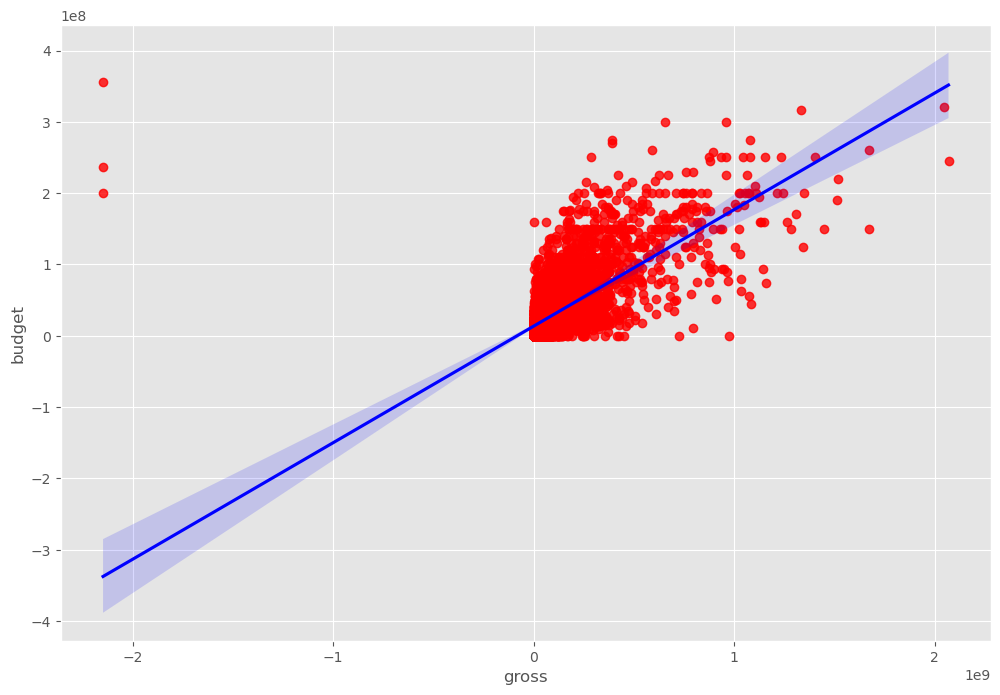

In [23]:
#plot budget vs gross
sns.regplot(x="gross", y="budget", data=df, scatter_kws={"color":"red"}, line_kws={"color":"blue"})

In [27]:
df = df.dropna()

In [30]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,June,8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,July,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,June,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,July,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,July,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0
5,Friday the 13th,R,Horror,1980,May,6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0
6,The Blues Brothers,R,Action,1980,June,7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.0
7,Raging Bull,R,Biography,1980,Dece,8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.0
8,Superman II,PG,Action,1980,June,6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0
9,The Long Riders,R,Biography,1980,May,7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.0


In [31]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,June,8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,July,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,June,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,July,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,July,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0


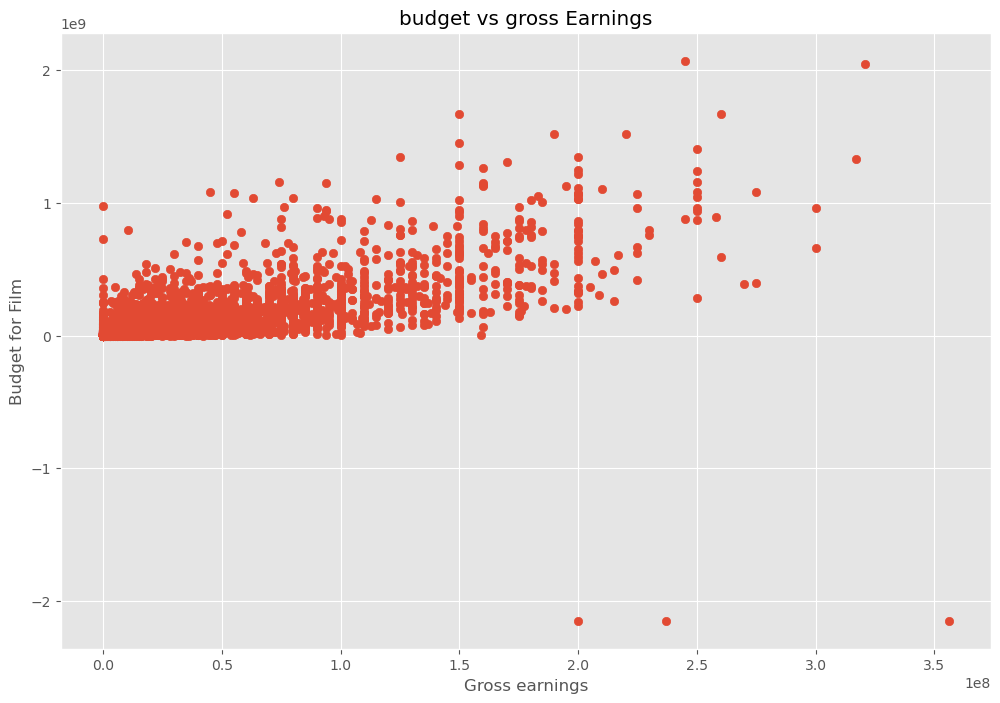

In [32]:
#scatter plot with budget vs gross

plt.scatter(x=df['budget'], y=df['gross'])
plt.title('budget vs gross Earnings')
plt.xlabel('Gross earnings')
plt.ylabel('Budget for Film')
plt.show()

<Axes: xlabel='gross', ylabel='budget'>

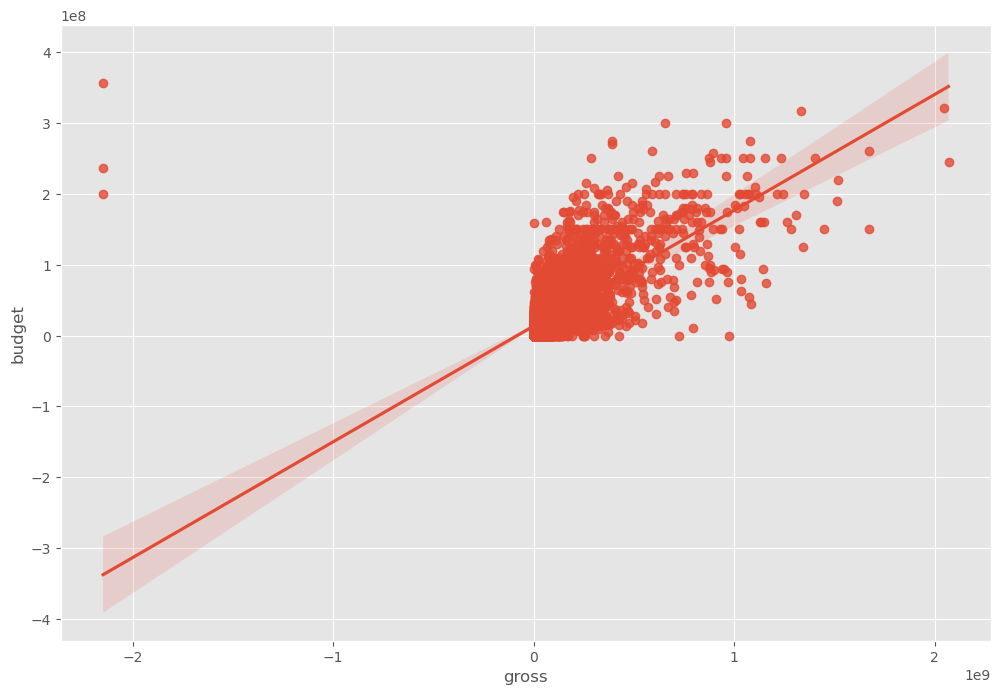

In [33]:
#plot budget vs gross using seaborn
sns.regplot(x="gross", y="budget", data=df)

In [40]:
df.corr(numeric_only='TRUE',method='pearson')

,year,score,votes,budget,gross,runtime
year,1.000000,0.070606,0.339302,0.214967,0.221150,0.096862
score,0.070606,1.000000,0.304058,-0.004328,0.091155,0.284159
votes,0.339302,0.304058,1.000000,0.436356,0.557816,0.198342
budget,0.214967,-0.004328,0.436356,1.000000,0.539040,0.177497
gross,0.221150,0.091155,0.557816,0.539040,1.000000,0.174819
runtime,0.096862,0.284159,0.198342,0.177497,0.174819,1.000000


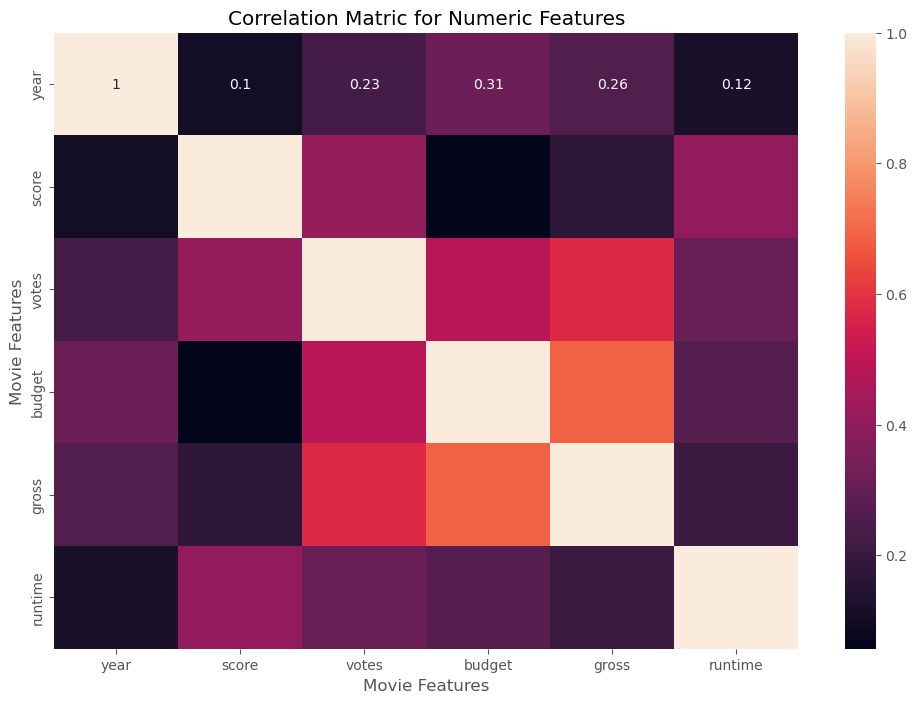

In [42]:
correlation_matrix = df.corr(numeric_only='TRUE',method='pearson')
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Matric for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

In [43]:
df_numerized = df

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name]= df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes
        
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,6506,6,6,1980,14,8.4,927000.0,2544,3958,1022,54,19000000,46998772,2273,146.0
1,5498,6,1,1980,13,5.8,65000.0,2233,1612,316,55,4500000,58853106,710,104.0
2,5073,4,0,1980,14,8.7,1200000.0,1093,2534,1708,55,18000000,538375067,1505,124.0
3,282,4,4,1980,13,7.7,221000.0,1279,1975,2197,55,3500000,83453539,1769,88.0
4,1016,6,4,1980,13,7.3,108000.0,1037,511,398,55,6000000,39846344,1736,98.0
5,2088,6,9,1980,16,6.4,123000.0,2486,4304,234,55,550000,39754601,1769,95.0
6,5499,6,0,1980,14,7.9,188000.0,1390,821,1250,55,27000000,115229890,2236,133.0
7,4374,6,3,1980,10,8.2,330000.0,1799,1747,2191,55,18000000,23402427,612,129.0
8,5210,4,0,1980,14,6.8,101000.0,2267,1955,855,55,54000000,108185706,861,127.0
9,6133,6,3,1980,16,7.0,10000.0,2816,413,572,55,10000000,15795189,2227,100.0


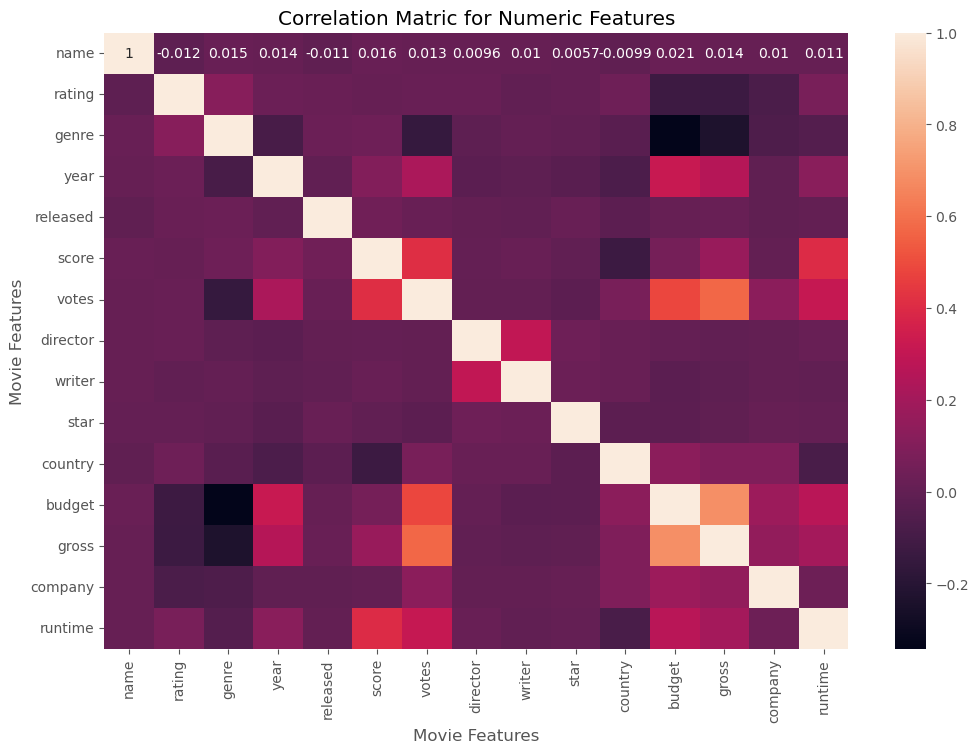

In [45]:
correlation_matrix = df_numerized.corr(numeric_only='TRUE',method='pearson')
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Matric for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

In [46]:
df_numerized.corr(numeric_only='TRUE')

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
name,1.000000,-0.011924,0.015300,0.013514,-0.011091,0.016181,0.013180,0.009608,0.010217,0.005685,-0.009939,0.020825,0.013772,0.010073,0.011151
rating,-0.011924,1.000000,0.117566,0.024989,0.021170,0.011538,0.016086,0.017205,-0.004387,0.005905,0.037738,-0.126806,-0.128424,-0.076807,0.069089
genre,0.015300,0.117566,1.000000,-0.088172,0.028490,0.040090,-0.148420,-0.013508,0.007351,-0.003525,-0.031485,-0.342064,-0.236081,-0.068678,-0.044631
year,0.013514,0.024989,-0.088172,1.000000,-0.003922,0.102346,0.226895,-0.022765,-0.012318,-0.027691,-0.070266,0.314842,0.259044,-0.009026,0.120676
released,-0.011091,0.021170,0.028490,-0.003922,1.000000,0.041866,0.017834,-0.000558,-0.003791,0.017934,-0.020574,0.011698,0.014849,-0.007272,-0.000563
score,0.016181,0.011538,0.040090,0.102346,0.041866,1.000000,0.411931,0.008071,0.019084,-0.002193,-0.130094,0.056781,0.171122,0.000316,0.400574
votes,0.013180,0.016086,-0.148420,0.226895,0.017834,0.411931,1.000000,-0.000627,0.000177,-0.020977,0.069582,0.485301,0.573871,0.129596,0.309366
director,0.009608,0.017205,-0.013508,-0.022765,-0.000558,0.008071,-0.000627,1.000000,0.297479,0.037570,0.015245,0.004140,-0.005649,0.001337,0.017386
writer,0.010217,-0.004387,0.007351,-0.012318,-0.003791,0.019084,0.000177,0.297479,1.000000,0.026584,0.014937,-0.027145,-0.016380,0.003035,-0.004526
star,0.005685,0.005905,-0.003525,-0.027691,0.017934,-0.002193,-0.020977,0.037570,0.026584,1.000000,-0.017626,-0.021930,-0.011032,0.009317,0.008474


In [47]:
correlation_mat = df_numerized.corr(numeric_only='TRUE')
corr_pairs = correlation_mat.unstack()
corr_pairs

name      name        1.000000
          rating     -0.011924
          genre       0.015300
          year        0.013514
          released   -0.011091
          score       0.016181
          votes       0.013180
          director    0.009608
          writer      0.010217
          star        0.005685
          country    -0.009939
          budget      0.020825
          gross       0.013772
          company     0.010073
          runtime     0.011151
rating    name       -0.011924
          rating      1.000000
          genre       0.117566
          year        0.024989
          released    0.021170
          score       0.011538
          votes       0.016086
          director    0.017205
          writer     -0.004387
          star        0.005905
          country     0.037738
          budget     -0.126806
          gross      -0.128424
          company    -0.076807
          runtime     0.069089
genre     name        0.015300
          rating      0.117566
        

In [48]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

genre     budget     -0.342064
budget    genre      -0.342064
gross     genre      -0.236081
genre     gross      -0.236081
votes     genre      -0.148420
genre     votes      -0.148420
score     country    -0.130094
country   score      -0.130094
rating    gross      -0.128424
gross     rating     -0.128424
budget    rating     -0.126806
rating    budget     -0.126806
genre     year       -0.088172
year      genre      -0.088172
runtime   country    -0.081464
country   runtime    -0.081464
rating    company    -0.076807
company   rating     -0.076807
country   year       -0.070266
year      country    -0.070266
company   genre      -0.068678
genre     company    -0.068678
runtime   genre      -0.044631
genre     runtime    -0.044631
country   genre      -0.031485
genre     country    -0.031485
year      star       -0.027691
star      year       -0.027691
writer    budget     -0.027145
budget    writer     -0.027145
year      director   -0.022765
director  year       -0.022765
star    

In [49]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
high_corr

gross     votes       0.573871
votes     gross       0.573871
budget    gross       0.687292
gross     budget      0.687292
name      name        1.000000
director  director    1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
votes     votes       1.000000
score     score       1.000000
released  released    1.000000
year      year        1.000000
genre     genre       1.000000
rating    rating      1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64

In [ ]:
#votes and budget have the highest correlation to gross earnings
#company has low correlation